# Capstone Project - The Battle of Neighborhoods

## **1. Introduction**

### Business Problem : Open Cafe Business in Seoul
##### Coffee is important for life. Cafe becomes a third place for everyone who wants to stay withouth any housework.
##### Many people comes to cafe for chatting with acquintances, reading books and studying, or just enjoying taste of coffee.<br>

##### How about opening cafe in Seoul?
##### There are so many Cafes are in Seoul city and Koreans drinks 1.3 cup of coffee each day according to survey.

##### So, Opening cafe business in Seoul seems like jumping into the red ocean.

##### Nevetheless, There are so many opportunities for opening cafe in Seoul.
##### Sales at coffee shops in Korea have grown from \$600 million in 2007 to \$4.3 billion (4.87 trillion won) in 2018.

##### In this analysis, we'll gather information for opening cafe business.
##### We will search some places of Seoul, and find proper place for opening cafe business.

### Data for solving this business problem
##### In this analysis, I'll find proper place for opening cafe business in Seoul.
##### So, I have to know information of neighborhoods in Seoul.

##### I will use location data of Seoul from Public Seoul Data hub(https://data.seoul.go.kr/)
##### and foot traffic data of Seoul from SK Data Hub(https://www.bigdatahub.co.kr/) with SK Data Hub API.
##### With location data and foursquare api, I will find some cafes in Seoul and make dataframe for it.
##### with these data, I'll find proper neighborhood 

### Methodology for Data Analysis
##### First, I'll do Exploratory Data Analysis and check status of the Seoul.
##### Second, With data, I'll make scores for neighborhoods.
##### With scores, I'll select a proper neighborhood for opening cafe business and explain result of analysis.

## **2. Data Collection and Preprocessing**

##### In this part, I Gathered data for analysis from SK Data Hub and Foursquare,
##### check data types and null data, preprocessed data for analysis

In [ ]:
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup

import json
import csv
from json import load
import requests

In [72]:
# Gather foot traffic data of Seoul
def SK_DATA_HUB_API(page, count):
    loc_list=[]
    for i in range(1,page):
        url_s='https://api.bigdatahub.co.kr/v1/datahub/datasets/search.json?TDCAccessKey=af57a8fcc696b7a6528c3520df4d079897a61157f13a56f8f23817d84f598602&pid=1002302&$page={}&$count={}'.format(i, count)
        response = requests.get(url_s).json()
        for k in response['entry']:
            if len(response['entry']) != 0:
                loc_list.append(k)
            else:
                break
    df_1=pd.DataFrame(loc_list)
    return df_1

In [73]:
# set pid=1002302
df_people = SK_DATA_HUB_API(1000,100000)

In [74]:
len(df_people)

220800

In [75]:
df_people

,일자,시간(1시간단위),연령대(10세단위),성별,시,군구,유동인구수
0,20200501,01,20,남성,서울,중구,12000
1,20200501,01,20,여성,서울,은평구,28680
2,20200501,01,50,남성,서울,관악구,34470
3,20200501,01,50,여성,서울,강북구,26500
4,20200501,01,70,여성,서울,은평구,24120
...,...,...,...,...,...,...,...
220795,20200531,21,40,여성,서울,도봉구,27620
220796,20200531,21,40,여성,서울,송파구,56560
220797,20200531,21,50,여성,서울,강동구,38960
220798,20200531,22,60,여성,서울,구로구,25420


In [76]:
df_people.to_csv('foot-traffic-of-seoul-may-2020.csv',index=False)

In [2]:
df_people = pd.read_csv('foot-traffic-of-seoul-may-2020.csv')

In [5]:
df_people.dtypes

일자             int64
시간(1시간단위)      int64
연령대(10세단위)     int64
성별            object
시             object
군구            object
유동인구수          int64
dtype: object

In [6]:
df_people[['일자','시간(1시간단위)','연령대(10세단위)']] = df_people[['일자','시간(1시간단위)','연령대(10세단위)']].astype('object')

In [7]:
df_people.dtypes

일자            object
시간(1시간단위)     object
연령대(10세단위)    object
성별            object
시             object
군구            object
유동인구수          int64
dtype: object

In [8]:
# Define Foursquare Credentials and Version
#client_id = 'I4PGBQ25FQ2AJWM0R5CIA4ZEXDVPCACKLL2DNWCGAYSXPWMR' 
#client_secret = 'TPFTTTMCOGHMGLSDBIQXQB0PCSTNPJCDLBIFDPAITHYRFPKT' 
version = '20200202'

#another credential
##  SUQMLF3HGWBGZ4R5GJBSFSFOPWV4FBEPZTU5JQB1VPF3B4HJ
### Y0OPAEQJM4IZPUKXU114Q04IKM5G50FN1UAQZ1WMNOVTNPKY

client_id = 'SUQMLF3HGWBGZ4R5GJBSFSFOPWV4FBEPZTU5JQB1VPF3B4HJ'
client_secret = 'Y0OPAEQJM4IZPUKXU114Q04IKM5G50FN1UAQZ1WMNOVTNPKY'

In [3]:
df_loc = pd.read_csv("seoul_neighborhood_location_data.csv", encoding='euc-kr')

In [4]:
df_loc

,순번,시군구코드,시군구명_한글,시군구명_영문,ESRI_PK,위도,경도
0,1,11320,도봉구,Dobong-gu,0,37.665861,127.031767
1,2,11380,은평구,Eunpyeong-gu,1,37.617612,126.922700
2,3,11230,동대문구,Dongdaemun-gu,2,37.583801,127.050700
3,4,11590,동작구,Dongjak-gu,3,37.496504,126.944307
4,5,11545,금천구,Geumcheon-gu,4,37.460097,126.900155
5,6,11530,구로구,Guro-gu,5,37.495486,126.858121
6,7,11110,종로구,Jongno-gu,6,37.599100,126.986149
7,8,11305,강북구,Gangbuk-gu,7,37.646995,127.014716
8,9,11260,중랑구,Jungnang-gu,8,37.595379,127.093967
9,10,11680,강남구,Gangnam-gu,9,37.495985,127.066409


In [4]:
def getVenues(lat, lng, radius, LIMIT):
    venueList=[]
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        client_id, 
        client_secret, 
        version, 
        lat, 
        lng, 
        radius, 
        LIMIT)
    v=requests.get(url).json()['response']['venues']
    for i in v:
        venue=[]
        try:
            category_id=i['categories'][0]['id']
            category_name=i['categories'][0]['name']
        except:
            category_id='NaN'
            category_name='None'
        venue_id=i['id']
        venue_name=i['name']
        try:
            venue_city=i['location']['city']
        except:
            venue_city='NaN'
        venue_lat=i['location']['lat']
        venue_lng=i['location']['lng']
        venue.append(venue_id)
        venue.append(venue_name)
        venue.append(venue_city)
        venue.append(venue_lat)
        venue.append(venue_lng)
        venue.append(category_id)
        venue.append(category_name)
        venueList.append(venue)
    return venueList

In [ ]:
getVenues(df_loc.iloc[0][5],df_loc.iloc[0][6],1000,1000)

In [9]:
all_venues=[]
for i in range(0,len(df_loc)):
    region=[]
    venues=getVenues(df_loc.iloc[i][5],df_loc.iloc[i][6],1000,1000)
    region.append(list(df_loc.iloc[i])[2])
    region.append(list(df_loc.iloc[i])[3])
    region.append(venues)
    all_venues.append(region)

In [13]:
all_venue=[]
for i in all_venues:
    for k in i[2]:
        venue=[]
        venue.append(i[0])
        venue.append(i[1])
        for a in k:
            venue.append(a)
        all_venue.append(venue)

### Venue Data Finding Example

- likes
- dislike
- stats


In [14]:
len(all_venue)

2744

In [15]:
venue_df = pd.DataFrame(data=all_venue, columns=['NEIGBORHOOD-NAME','NEIGHBORHOOD-ENG','VENUE-CODE','VENUE-NAME','NEIGHBORHOOD','LAT','LONG','CLASS-CODE','CLASS-NAME'])

In [16]:
venue_df

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
0,도봉구,Dobong-gu,4d20a0890901721e361a94a5,방학중학교,도봉구,37.665495,127.031468,4f4533814b9074f6e4fb0106,Middle School
1,도봉구,Dobong-gu,4c037e44310fc9b6f3fbc561,방학동 도깨비시장,도봉구,37.665427,127.035603,50be8ee891d4fa8dcc7199a7,Market
2,도봉구,Dobong-gu,4e012731d4c0836163dadc7e,안방학동 정류장,서울특별시,37.666350,127.033159,4bf58dd8d48988d1fe931735,Bus Station
3,도봉구,Dobong-gu,5441bee6498e887d41c62ccb,우이동,NaN,37.666343,127.030660,4bf58dd8d48988d130941735,Building
4,도봉구,Dobong-gu,4c31d735ed37a59340dd6a03,오찾사,도봉구,37.666787,127.034103,4bf58dd8d48988d113941735,Korean Restaurant
...,...,...,...,...,...,...,...,...,...
2739,용산구,Yongsan-gu,4d81db972ad9a14351c17a28,Field 9,NaN,37.528585,126.982647,4bf58dd8d48988d1e8941735,Baseball Field
2740,용산구,Yongsan-gu,5325dbe911d2ce1ee62b0cf6,Barracks 4489 USAG Yongsan,NaN,37.531498,126.984923,4d954b06a243a5684965b473,Residential Building (Apartment / Condo)
2741,용산구,Yongsan-gu,4e7d3ae8cc215279be1f0090,USAGY SKIES Soccer Field,서울특별시,37.528365,126.983412,4cce455aebf7b749d5e191f5,Soccer Field
2742,용산구,Yongsan-gu,5299539d498e4562c06dda8e,Army Navy Football Game Yongsan,NaN,37.529675,126.979073,4f4528bc4b90abdf24c9de85,Athletics & Sports


In [81]:
# Check duplicates of data
len(venues['VENUE-CODE'].unique())

2744

- there is no duplicate place in this data.(No duplicate places are collected.)
- We will process Exploratory Data Analysis

In [20]:
venue_df.to_csv("venues-of-seoul.csv",index=False)

In [3]:
venue_df = pd.read_csv("venues-of-seoul.csv")

In [4]:
venue_df

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
0,도봉구,Dobong-gu,4d20a0890901721e361a94a5,방학중학교,도봉구,37.665495,127.031468,4f4533814b9074f6e4fb0106,Middle School
1,도봉구,Dobong-gu,4c037e44310fc9b6f3fbc561,방학동 도깨비시장,도봉구,37.665427,127.035603,50be8ee891d4fa8dcc7199a7,Market
2,도봉구,Dobong-gu,4e012731d4c0836163dadc7e,안방학동 정류장,서울특별시,37.666350,127.033159,4bf58dd8d48988d1fe931735,Bus Station
3,도봉구,Dobong-gu,5441bee6498e887d41c62ccb,우이동,NaN,37.666343,127.030660,4bf58dd8d48988d130941735,Building
4,도봉구,Dobong-gu,4c31d735ed37a59340dd6a03,오찾사,도봉구,37.666787,127.034103,4bf58dd8d48988d113941735,Korean Restaurant
...,...,...,...,...,...,...,...,...,...
2739,용산구,Yongsan-gu,4d81db972ad9a14351c17a28,Field 9,NaN,37.528585,126.982647,4bf58dd8d48988d1e8941735,Baseball Field
2740,용산구,Yongsan-gu,5325dbe911d2ce1ee62b0cf6,Barracks 4489 USAG Yongsan,NaN,37.531498,126.984923,4d954b06a243a5684965b473,Residential Building (Apartment / Condo)
2741,용산구,Yongsan-gu,4e7d3ae8cc215279be1f0090,USAGY SKIES Soccer Field,서울특별시,37.528365,126.983412,4cce455aebf7b749d5e191f5,Soccer Field
2742,용산구,Yongsan-gu,5299539d498e4562c06dda8e,Army Navy Football Game Yongsan,NaN,37.529675,126.979073,4f4528bc4b90abdf24c9de85,Athletics & Sports


In [21]:
venue_df['CLASS-NAME'].value_counts()

Korean Restaurant      282
None                   186
Café                   152
BBQ Joint               73
Coffee Shop             69
                      ... 
Vineyard                 1
Embassy / Consulate      1
Knitting Store           1
Travel Agency            1
Assisted Living          1
Name: CLASS-NAME, Length: 309, dtype: int64

In [53]:
venue_df['CLASS-NAME'].unique()

array(['Middle School', 'Market', 'Bus Station', 'Building',
       'Korean Restaurant', 'None', 'Capitol Building',
       'Asian Restaurant', 'Hospital', 'Café', 'Pizza Place',
       'Restaurant', 'Laundry Service', 'Food', "Doctor's Office",
       'Food Truck', 'Seafood Restaurant', 'Sake Bar',
       'Elementary School', 'Monument / Landmark', 'Coffee Shop',
       "Dentist's Office", 'Bowling Alley', 'Karaoke Bar',
       'Fried Chicken Joint', 'Salon / Barbershop', 'Pub', 'Park', 'Bar',
       'Gym / Fitness Center', 'Bank', 'Medical Center', 'Gas Station',
       'Automotive Shop', 'Noodle House', 'BBQ Joint', 'Church', 'Gym',
       'Chinese Restaurant', 'Convenience Store', 'Multiplex',
       'Fast Food Restaurant', 'Comic Shop', 'Bus Stop',
       'Japanese Restaurant', 'Burger Joint', 'Nail Salon',
       'Udon Restaurant', 'Pharmacy', 'Bakery', 'Sporting Goods Shop',
       'Yoga Studio', 'Jewelry Store', 'Credit Union', 'Bistro',
       'Ramen Restaurant', 'Acupuncturis

In [54]:
venue_df[venue_df['CLASS-NAME']=='Dessert Shop']

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
358,동작구,Dongjak-gu,4bc2b2d52a89ef3b9e27f488,떡프린스,서울특별시,37.498206,126.944929,4bf58dd8d48988d1d0941735,Dessert Shop
537,구로구,Guro-gu,50a0df32e4b00baa8df5f854,워니 쿠키 (Wonny Cookies),서울특별시,37.495840,126.856696,4bf58dd8d48988d1d0941735,Dessert Shop
651,종로구,Jongno-gu,5bb97936911fc4002c523c3c,동병상련,서울특별시,37.599374,126.992788,4bf58dd8d48988d1d0941735,Dessert Shop
687,종로구,Jongno-gu,4c4af260712ac9286f93316c,J's Cake,서울특별시,37.594523,126.988784,4bf58dd8d48988d1d0941735,Dessert Shop
1020,강남구,Gangnam-gu,4d17ef0385fc6dcb6d75b14e,여의도떡방,서울특별시,37.494412,127.066606,4bf58dd8d48988d1d0941735,Dessert Shop
1085,강서구,Gangseo-gu,5af8220618d43b002c12eb0c,Brown it,서울특별시,37.567971,126.825313,4bf58dd8d48988d1d0941735,Dessert Shop
1097,강서구,Gangseo-gu,5ec0c253353a090007ce7b6e,인라이크,강서구,37.568655,126.822524,4bf58dd8d48988d1d0941735,Dessert Shop
1156,강서구,Gangseo-gu,5cf7a6700d173f002c02d350,Minette,서울특별시,37.567587,126.825885,4bf58dd8d48988d1d0941735,Dessert Shop
1255,중구,Jung-gu,54e2eba2498e89ccb345d660,도향촌,서울특별시,37.557096,126.995822,4bf58dd8d48988d1d0941735,Dessert Shop
1369,강동구,Gangdong-gu,53bd23b4498ee786809cd3be,동그림,NaN,37.549852,127.146502,4bf58dd8d48988d1d0941735,Dessert Shop


In [58]:
venue_df[venue_df['CLASS-NAME']=='Smoothie Shop']

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
2725,용산구,Yongsan-gu,51ad4f97498e16b094dbf54b,Jamba Juice,서울특별시,37.52963,126.982181,52f2ab2ebcbc57f1066b8b41,Smoothie Shop


In [66]:
venue_df[venue_df['CLASS-NAME']=='Bubble Tea Shop']

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
1692,서초구,Seocho-gu,54eaa271498e4b3160afa7a7,Gong Cha (공차),서울특별시,37.477361,127.037521,52e81612bcbc57f1066b7a0c,Bubble Tea Shop


In [5]:
#How many coffee shops or Cafés in Seoul?
cafe_df = venue_df[venue_df['CLASS-NAME'].isin(['Coffee Shop','Café','Dessert Shop','Smoothie Shop','Bubble Tea Shop'])]
cafe_df

,NEIGBORHOOD-NAME,NEIGHBORHOOD-ENG,VENUE-CODE,VENUE-NAME,NEIGHBORHOOD,LAT,LONG,CLASS-CODE,CLASS-NAME
9,도봉구,Dobong-gu,5ca332e398fbfc002ce3d936,온도감,서울특별시,37.663998,127.035164,4bf58dd8d48988d16d941735,Café
29,도봉구,Dobong-gu,4ed2253329c223f92af50084,TOM N TOMS COFFEE,서울특별시,37.667102,127.033650,4bf58dd8d48988d1e0931735,Coffee Shop
54,도봉구,Dobong-gu,4ef6907c61af4546fdac5503,요거프레스,NaN,37.663294,127.030418,4bf58dd8d48988d16d941735,Café
84,은평구,Eunpyeong-gu,5e2d50e63bd73a000804a75b,1994양과점,서울특별시,37.617695,126.921603,4bf58dd8d48988d16d941735,Café
85,은평구,Eunpyeong-gu,52ad3b0c498e04bca3086414,EDIYA COFFEE (이디야커피),서울특별시,37.617084,126.923247,4bf58dd8d48988d1e0931735,Coffee Shop
...,...,...,...,...,...,...,...,...,...
2615,성동구,Seongdong-gu,5d8498ed36e5fa00088f765b,Blankness,성동구,37.550835,127.044033,4bf58dd8d48988d1e0931735,Coffee Shop
2617,성동구,Seongdong-gu,5ce231a3a5a315002cc7ae55,Clip Espresso,성동구,37.550453,127.043903,4bf58dd8d48988d16d941735,Café
2644,용산구,Yongsan-gu,4fa3b253e4b01acec2943c56,sundaes,NaN,37.531368,126.981781,4bf58dd8d48988d1e0931735,Coffee Shop
2714,용산구,Yongsan-gu,57564742498e5bcf9793cca6,Caffe Italia,NaN,37.530642,126.976783,4bf58dd8d48988d1e0931735,Coffee Shop


In [23]:
cafe_df['NEIGBORHOOD-NAME'].value_counts()

서초구     20
중구      19
강서구     17
마포구     16
동대문구    14
종로구     13
강동구     12
광진구     12
송파구     11
은평구     11
성북구     10
양천구     10
금천구      9
구로구      9
영등포구     7
관악구      7
중랑구      7
강북구      7
동작구      6
서대문구     4
노원구      3
성동구      3
용산구      3
도봉구      3
강남구      2
Name: NEIGBORHOOD-NAME, dtype: int64

In [67]:
cafe_df[['NEIGBORHOOD-NAME','CLASS-NAME']].groupby('NEIGBORHOOD-NAME').count().sort_values(by='CLASS-NAME',ascending=False)

,CLASS-NAME
NEIGBORHOOD-NAME,
서초구,20
중구,19
강서구,17
마포구,16
동대문구,14
종로구,13
광진구,12
강동구,12
은평구,11


- There are 235 places collected with Foursquare api.<br>
details about venue : https://developer.foursquare.com/docs/api-reference/venues/details<br>
format of the data of venue : https://api.foursquare.com/v2/venues/VENUE_ID

In [6]:
def getVenueData(venue_id, client_id, client_secret, version):
    venueList=[]
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(
        venue_id,
        client_id, 
        client_secret, 
        version)
    
    return requests.get(url).json()['response']['venue']

In [9]:
tipCount=[]
likes=[]
price=[]
price_str=[]

for i in range(200,len(cafe_df)):
    venue_id = cafe_df.iloc[i,2] 
    rep = getVenueData(venue_id, client_id, client_secret, version)
    tipCount.append(rep['stats']['tipCount'])
    likes.append(rep['likes']['count'])
    try:
        price.append(rep['price']['tier'])
        price_str.append(rep['price']['message'])
    except:
        price.append('None')
        price_str.append('None')

In [51]:
data_venue = pd.DataFrame(data={'TIP-COUNT':tipCount, 'LIKES' : likes, 'PRICE' : price, 'PRICE-STR' : price_str},
                         columns=['TIP-COUNT','LIKES','PRICE','PRICE-STR'])

In [ ]:
data_venue_other = pd.DataFrame(data={'TIP-COUNT':tipCount, 'LIKES' : likes, 'PRICE' : price, 'PRICE-STR' : price_str},
                         columns=['TIP-COUNT','LIKES','PRICE','PRICE-STR'])

In [54]:
data_venue.to_csv('venue-data-information-200.csv',index=False)

In [14]:
data_venue_all = pd.concat([data_venue, data_venue_other])

In [16]:
data_venue_all[data_venue_all['PRICE']=='None']

,TIP-COUNT,LIKES,PRICE,PRICE-STR
147,0,0,None,None
158,1,4,None,None
34,1,2,None,None


In [30]:
cafe_df['TIP_COUNT']=list(data_venue_all['TIP-COUNT'])
cafe_df['LIKES_COUNT']=list(data_venue_all['LIKES'])
cafe_df['PRICE_LEVEL']=list(data_venue_all['PRICE'])
cafe_df['PRICE_LEVEL_STR']=list(data_venue_all['PRICE-STR'])

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Anaconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.

In [32]:
cafe_df.to_csv('cafe_venue_data.csv',index=False)

## **3. Data Analysis**

### In this part, Exploratory Data Analysis will be processed.

#### Exploratory Data Analysis With foot traffic data

In [1]:
import pandas as pd
import numpy as np
import json
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import folium

In [2]:
df_people = pd.read_csv('foot-traffic-of-seoul-may-2020.csv')
df_loc = pd.read_csv("seoul_neighborhood_location_data.csv", encoding='euc-kr')
venue_df = pd.read_csv("venues-of-seoul.csv")
cafe_df = pd.read_csv("cafe_venue_data.csv")

In [3]:
df_people[['일자','시간(1시간단위)','연령대(10세단위)']] = df_people[['일자','시간(1시간단위)','연령대(10세단위)']].astype('object')

In [4]:
df_loc_5wol=df_people[['군구','유동인구수']].groupby('군구').mean()

In [5]:
df_loc_5wol=df_loc_5wol.reset_index()

In [6]:
geo_path = './seoul_municipalities_geo.json'
geo_str = json.load(open(geo_path, encoding='utf-8'))

In [7]:
# foot traffic choropleth map of Seoul
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_loc_5wol,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [8]:
df_loc_5wol.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
0,강남구,47965.807292
17,송파구,43007.181839
3,강서구,36449.266304
14,서초구,33899.488225
8,노원구,33040.048687
4,관악구,32827.153533
19,영등포구,32255.355525
6,구로구,29195.157382
16,성북구,28128.134058
12,마포구,28067.927989


##### - Gangnam, Songpa, Gangseo, Seocho, Nowon are top 5 foot trapic neighborhoods.
##### - The best foot traffic place is Gangnam.
##### - the fact that more people walks around means there are many chances of business.

In [147]:
#구별 카페 수 분포
pd.DataFrame(cafe_df['NEIGBORHOOD-NAME'].value_counts()).reset_index().head(10)

,index,NEIGBORHOOD-NAME
0,서초구,20
1,중구,19
2,강서구,17
3,마포구,16
4,동대문구,14
5,종로구,13
6,광진구,12
7,강동구,12
8,은평구,11
9,송파구,11


In [10]:
pd.DataFrame(cafe_df['NEIGBORHOOD-NAME'].value_counts()).tail(10)

,NEIGBORHOOD-NAME
관악구,7
강북구,7
중랑구,7
동작구,6
서대문구,4
노원구,3
도봉구,3
용산구,3
성동구,3
강남구,2


- Secho, Jung-gu, Gangseo, Mapo, Dongdaemun districts are top 5 districts that have many cafes.
- Gangnam, Seongdong, Yongsan, Dobong, Nowon districts are last 5 districts that have many cafes.

In [11]:
# cafe distribution on Seoul
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=cafe_df['NEIGBORHOOD-NAME'].value_counts(),
             columns=('군구','NEIGBORHOOD-NAME'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

- This map views the status of competition.
- Seocho is the best competitive market place of cafe business.
- Unlike analysis of foot print of Seoul, the least number of cafes are in Gangnam.
- So, we have to check up and analyze, preprocess data for finding SWEET SPOT for cafe business.

In [13]:
#연령대별 구별 유동인구 분포 지도 시각화
df_df=df_people[['군구','연령대(10세단위)','성별','유동인구수']].groupby(['군구','성별','연령대(10세단위)']).mean().reset_index()
df_df

,군구,성별,연령대(10세단위),유동인구수
0,강남구,남성,20,50082.581522
1,강남구,남성,30,70600.176630
2,강남구,남성,40,65379.320652
3,강남구,남성,50,49338.016304
4,강남구,남성,60,27843.179348
...,...,...,...,...
295,중랑구,여성,30,26562.133152
296,중랑구,여성,40,29220.597826
297,중랑구,여성,50,32970.095109
298,중랑구,여성,60,21356.372283


In [14]:
df_df.groupby('연령대(10세단위)').mean().reset_index().sort_values(by='유동인구수',ascending=False)

,연령대(10세단위),유동인구수
1,30,33351.856793
2,40,33152.507880
3,50,31098.679076
0,20,30194.238587
4,60,19925.842120
5,70,15076.064946


- Age group is the critical index for consumption, business analysis.
- 30~40 age groups are major groups for cafe business.
- In fact, 20~49 age groups are critical for consumption according to many articles and it is a common sense of Korea.
- So, we have to check how many 30~40 age group people 

In [15]:
df_df.sort_values(by='유동인구수', ascending=False).head(10)

,군구,성별,연령대(10세단위),유동인구수
7,강남구,여성,30,71501.888587
1,강남구,남성,30,70600.176630
2,강남구,남성,40,65379.320652
6,강남구,여성,20,62473.980978
8,강남구,여성,40,61943.505435
211,송파구,여성,30,56599.334239
212,송파구,여성,40,56364.402174
205,송파구,남성,30,54407.445652
206,송파구,남성,40,53224.836957
213,송파구,여성,50,53135.883152


- When it comes to sex, female who's age is in 30 age group are major in Gangnam, where the number of foot traffic is best in Seoul.
- So, in Gangnam, 30-Female group is major target for cafe business.

In [161]:
df_20 = df_df[df_df['연령대(10세단위)']==20]
df_30 = df_df[df_df['연령대(10세단위)']==30]
df_40 = df_df[df_df['연령대(10세단위)']==40]
df_50 = df_df[df_df['연령대(10세단위)']==50]
df_60 = df_df[df_df['연령대(10세단위)']==60]
df_70 = df_df[df_df['연령대(10세단위)']==70]

In [162]:
df_20_all = df_20[['군구','유동인구수']].groupby('군구').sum().reset_index()
df_30_all = df_30[['군구','유동인구수']].groupby('군구').sum().reset_index()
df_40_all = df_40[['군구','유동인구수']].groupby('군구').sum().reset_index()
df_50_all = df_50[['군구','유동인구수']].groupby('군구').sum().reset_index()
df_60_all = df_60[['군구','유동인구수']].groupby('군구').sum().reset_index()
df_70_all = df_70[['군구','유동인구수']].groupby('군구').sum().reset_index()

In [167]:
df_20_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
0,강남구,112556.562500
17,송파구,90702.445652
4,관악구,89182.961957
3,강서구,75278.885870
12,마포구,73150.692935
14,서초구,72531.467391
8,노원구,72145.013587
16,성북구,68669.782609
11,동작구,66576.467391
19,영등포구,66189.918478


In [168]:
df_30_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
0,강남구,142102.065217
17,송파구,111006.779891
3,강서구,95654.524457
14,서초구,93437.024457
19,영등포구,85831.195652
4,관악구,83651.236413
12,마포구,77332.500000
6,구로구,74300.000000
8,노원구,68700.067935
1,강동구,64760.095109


In [171]:
df_40_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
0,강남구,127322.826087
17,송파구,109589.239130
14,서초구,91633.940217
3,강서구,87489.782609
8,노원구,87274.809783
19,영등포구,80060.502717
18,양천구,75296.698370
6,구로구,70501.032609
21,은평구,67973.260870
4,관악구,67948.057065


In [172]:
df_50_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
17,송파구,100366.915761
0,강남구,97456.902174
3,강서구,85380.475543
8,노원구,78779.633152
19,영등포구,76745.951087
14,서초구,73382.866848
6,구로구,70518.355978
1,강동구,69502.894022
18,양천구,68923.179348
4,관악구,67463.586957


In [173]:
df_60_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
17,송파구,64418.505435
0,강남구,58996.942935
3,강서구,54969.144022
4,관악구,48865.638587
8,노원구,48056.182065
6,구로구,46799.864130
19,영등포구,46497.309783
14,서초구,45871.494565
21,은평구,45404.524457
1,강동구,45091.453804


In [174]:
df_70_all.sort_values(by='유동인구수',ascending=False).head(10)

,군구,유동인구수
8,노원구,41524.877717
17,송파구,40002.296196
21,은평구,39906.467391
3,강서구,38618.383152
16,성북구,37340.230978
0,강남구,37154.388587
4,관악구,36814.361413
10,동대문구,32088.301630
19,영등포구,31739.388587
6,구로구,31403.614130


In [19]:
# foot traffic choropleth map of Seoul - 20
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_20_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [20]:
# foot traffic choropleth map of Seoul - 30
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_30_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [21]:
# foot traffic choropleth map of Seoul - 40
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_40_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [22]:
# foot traffic choropleth map of Seoul - 50
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_50_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [23]:
# foot traffic choropleth map of Seoul - 60
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_60_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

In [24]:
# foot traffic choropleth map of Seoul - 70
center = [37.541, 126.986]
m = folium.Map(location=center, zoom_start=11.5)
m.choropleth(geo_data = geo_str,
             data=df_70_all,
             columns=('군구','유동인구수'),
             key_on='feature.properties.name',
             fill_color='BuPu',
             legend_name='the number of foot traffic')
m

- Many people pass by Gangnam and Songpa districts
- Many younger people (from 20 to 40) pass by Gangnam absolutely than elder people.
- 40, 50 age groups are more distributed on Yangcheon district than other age groups.
- all age groups except 30 contains Nowon district on top 10 district of footprints, especially, 70 age group people pass by Nowon district most.

#### Scoring districts of Seoul

- In this part, with footprints data and cafe data, districts of Seoul are scored for decision making of opening cafe business.

In [111]:
df_for_analysis = df_loc[['시군구명_한글','시군구명_영문']]

In [112]:
cafe_number=pd.DataFrame(cafe_df['NEIGBORHOOD-NAME'].value_counts()).reset_index()

In [113]:
df_for_analysis = df_for_analysis.rename(columns={'시군구명_한글':'군구'})

In [114]:
cafe_number = cafe_number.rename(columns={'index':'군구'})

In [115]:
df_for_analysis=pd.merge(df_for_analysis, cafe_number)

In [116]:
df_for_analysis = df_for_analysis.rename(columns={'NEIGBORHOOD-NAME':'numb_cafes'})

In [117]:
df_for_analysis=pd.merge(df_for_analysis,df_20_all)

In [118]:
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'20_ageGroup_footprints'})

In [119]:
df_for_analysis=pd.merge(df_for_analysis,df_30_all)
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'30_ageGroup_footprints'})

In [120]:
df_for_analysis=pd.merge(df_for_analysis,df_40_all)
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'40_ageGroup_footprints'})

In [121]:
df_for_analysis=pd.merge(df_for_analysis,df_50_all)
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'50_ageGroup_footprints'})

In [122]:
df_for_analysis=pd.merge(df_for_analysis,df_60_all)
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'60_ageGroup_footprints'})

In [123]:
df_for_analysis=pd.merge(df_for_analysis,df_70_all)
df_for_analysis = df_for_analysis.rename(columns={'유동인구수':'70_ageGroup_footprints'})

In [124]:
cafe_ratings=cafe_df[['NEIGBORHOOD-NAME','TIP_COUNT','LIKES_COUNT']].groupby('NEIGBORHOOD-NAME').mean().reset_index()

In [125]:
cafe_ratings=cafe_ratings.rename(columns={'NEIGBORHOOD-NAME':'군구'})

In [126]:
df_for_analysis=pd.merge(df_for_analysis,cafe_ratings)

In [175]:
df_for_analysis

,군구,시군구명_영문,numb_cafes,20_ageGroup_footprints,30_ageGroup_footprints,40_ageGroup_footprints,50_ageGroup_footprints,60_ageGroup_footprints,70_ageGroup_footprints,TIP_COUNT,LIKES_COUNT,score_for_young,score_for_elder
0,도봉구,Dobong-gu,3,38750.815217,39985.774457,47534.483696,50481.875000,33278.899457,28992.146739,0.000000,0.000000,14030.119263,12528.102355
1,은평구,Eunpyeong-gu,11,52611.576087,63266.508152,67973.260870,64607.459239,45404.524457,39906.467391,0.272727,0.181818,8379.901029,4892.443625
2,동대문구,Dongdaemun-gu,14,59387.486413,52022.581522,52908.355978,54369.470109,38051.494565,32088.301630,0.214286,0.142857,5429.374551,3149.787987
3,동작구,Dongjak-gu,6,66576.467391,63297.377717,55780.883152,55413.505435,38864.646739,31337.690217,0.166667,0.166667,14038.706304,6978.657911
4,금천구,Geumcheon-gu,9,37106.779891,44881.861413,46826.847826,47811.195652,27606.141304,18249.157609,0.111111,0.000000,5301.048935,3854.588254
5,구로구,Guro-gu,9,56819.021739,74300.000000,70501.032609,70518.355978,46799.864130,31403.614130,0.666667,0.555556,19359.950349,5901.660089
6,종로구,Jongno-gu,13,43008.845109,44506.317935,43985.923913,40618.179348,23682.296196,18428.097826,3.230769,7.461538,120707.263858,1060.622736
7,강북구,Gangbuk-gu,7,37603.029891,40799.782609,45999.972826,47181.657609,34533.043478,30457.377717,0.142857,0.285714,8704.568069,4748.024500
8,중랑구,Jungnang-gu,7,48643.152174,53799.904891,56575.747283,62271.752717,40250.557065,30656.711957,0.857143,2.000000,42188.662378,3925.912205
9,강남구,Gangnam-gu,2,112556.562500,142102.065217,127322.826087,97456.902174,58996.942935,37154.388587,1.500000,1.000000,318317.878170,40335.048687


#### Correlation Analysis

#### - in this correlation analysis, we have to scale footprints data and counts of cafes, because of Covariance problem, which means range difference among data can make distortion of covariance.
#### - So, we have to match range of data, I will match it similar to range level of TIP_COUNT and LIKES_COUNT

In [128]:
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

In [135]:
df_for_analysis

,군구,시군구명_영문,numb_cafes,20_ageGroup_footprints,30_ageGroup_footprints,40_ageGroup_footprints,50_ageGroup_footprints,60_ageGroup_footprints,70_ageGroup_footprints,TIP_COUNT,LIKES_COUNT
0,도봉구,Dobong-gu,3,38750.815217,39985.774457,47534.483696,50481.875000,33278.899457,28992.146739,0.000000,0.000000
1,은평구,Eunpyeong-gu,11,52611.576087,63266.508152,67973.260870,64607.459239,45404.524457,39906.467391,0.272727,0.181818
2,동대문구,Dongdaemun-gu,14,59387.486413,52022.581522,52908.355978,54369.470109,38051.494565,32088.301630,0.214286,0.142857
3,동작구,Dongjak-gu,6,66576.467391,63297.377717,55780.883152,55413.505435,38864.646739,31337.690217,0.166667,0.166667
4,금천구,Geumcheon-gu,9,37106.779891,44881.861413,46826.847826,47811.195652,27606.141304,18249.157609,0.111111,0.000000
5,구로구,Guro-gu,9,56819.021739,74300.000000,70501.032609,70518.355978,46799.864130,31403.614130,0.666667,0.555556
6,종로구,Jongno-gu,13,43008.845109,44506.317935,43985.923913,40618.179348,23682.296196,18428.097826,3.230769,7.461538
7,강북구,Gangbuk-gu,7,37603.029891,40799.782609,45999.972826,47181.657609,34533.043478,30457.377717,0.142857,0.285714
8,중랑구,Jungnang-gu,7,48643.152174,53799.904891,56575.747283,62271.752717,40250.557065,30656.711957,0.857143,2.000000
9,강남구,Gangnam-gu,2,112556.562500,142102.065217,127322.826087,97456.902174,58996.942935,37154.388587,1.500000,1.000000


In [138]:
scaler = MinMaxScaler()
scaler.fit(df_for_analysis.iloc[:,2:-2])
df_scaled = scaler.transform(df_for_analysis.iloc[:,2:-2])
df_scaled = pd.DataFrame(df_scaled, columns=df_for_analysis.iloc[:,2:-2].columns)

In [139]:
df_scaled['TIP_COUNT'] = df_for_analysis['TIP_COUNT']
df_scaled['LIKES_COUNT'] = df_for_analysis['LIKES_COUNT']

In [140]:
import matplotlib.font_manager as fm
 
fm.get_fontconfig_fonts()
font_location = 'C:/Windows/Fonts/H2PORL.ttf'
font_name = fm.FontProperties(fname=font_location).get_name()
plt.rc('font', family=font_name)

In [141]:
sns.set(font="AppleGothic", 
        rc={"axes.unicode_minus":False},
        style='darkgrid')

C:\Anaconda\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning: findfont: Font family ['NanumGothic'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


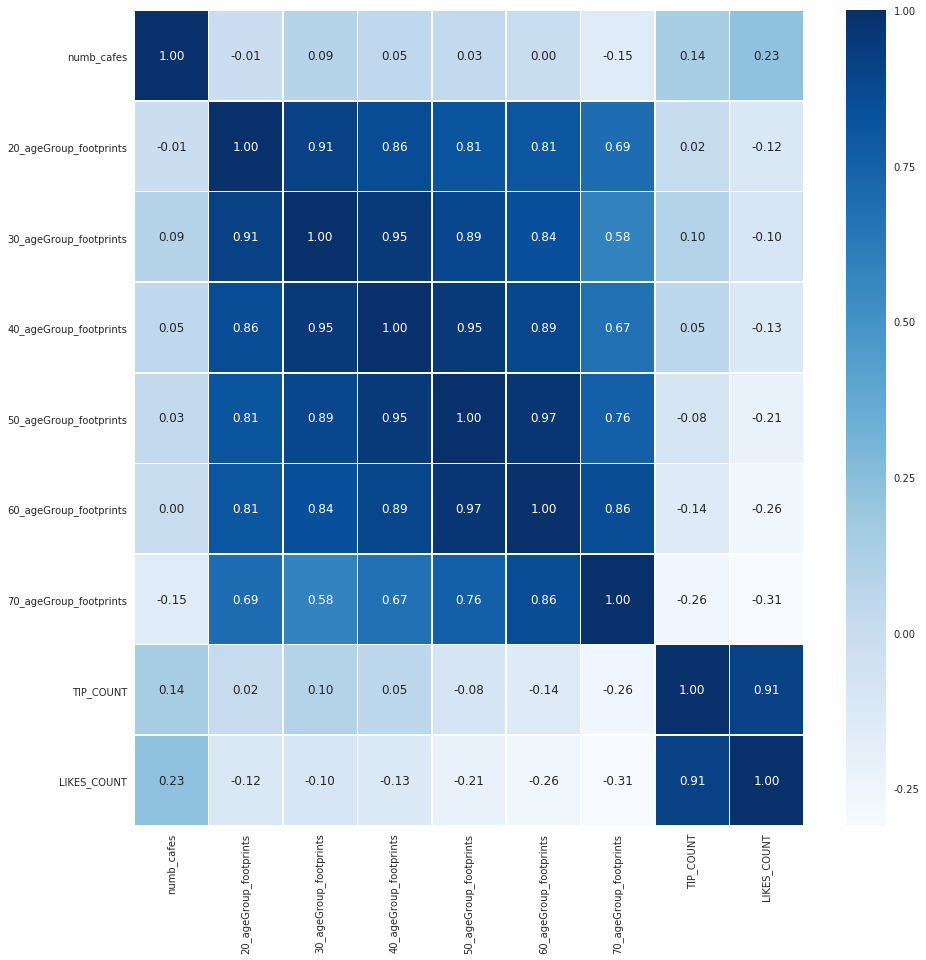

In [142]:
plt.rcParams['font.family'] = 'NanumGothic'
plt.figure(figsize=(15,15))
sns.heatmap(data = df_scaled.corr(), annot=True, fmt = '.2f', linewidths=.5, cmap='Blues')

#### - 50, 60, 70 age groups are moving homogeneously and 30, 40 age groups are also like that.
#### - 50, 60, 70 age groups are negative to people's ratings of cafes.
#### - 20, 30, 40 age groups are positive slightly to tip_count(which means the number of check-ins).
#### - When more cafes are in province, their ratings are slightly high.
#### - In this analysis, we can find some information about age groups.
#### - 20, 30, 40 age groups are different with 50, 60, 70 age groups.
#### - So, if we decide to select best place for opening cafe business, we have to divide conditions and select proper place for cafe business for each condition.

In [143]:
df_for_analysis

,군구,시군구명_영문,numb_cafes,20_ageGroup_footprints,30_ageGroup_footprints,40_ageGroup_footprints,50_ageGroup_footprints,60_ageGroup_footprints,70_ageGroup_footprints,TIP_COUNT,LIKES_COUNT
0,도봉구,Dobong-gu,3,38750.815217,39985.774457,47534.483696,50481.875000,33278.899457,28992.146739,0.000000,0.000000
1,은평구,Eunpyeong-gu,11,52611.576087,63266.508152,67973.260870,64607.459239,45404.524457,39906.467391,0.272727,0.181818
2,동대문구,Dongdaemun-gu,14,59387.486413,52022.581522,52908.355978,54369.470109,38051.494565,32088.301630,0.214286,0.142857
3,동작구,Dongjak-gu,6,66576.467391,63297.377717,55780.883152,55413.505435,38864.646739,31337.690217,0.166667,0.166667
4,금천구,Geumcheon-gu,9,37106.779891,44881.861413,46826.847826,47811.195652,27606.141304,18249.157609,0.111111,0.000000
5,구로구,Guro-gu,9,56819.021739,74300.000000,70501.032609,70518.355978,46799.864130,31403.614130,0.666667,0.555556
6,종로구,Jongno-gu,13,43008.845109,44506.317935,43985.923913,40618.179348,23682.296196,18428.097826,3.230769,7.461538
7,강북구,Gangbuk-gu,7,37603.029891,40799.782609,45999.972826,47181.657609,34533.043478,30457.377717,0.142857,0.285714
8,중랑구,Jungnang-gu,7,48643.152174,53799.904891,56575.747283,62271.752717,40250.557065,30656.711957,0.857143,2.000000
9,강남구,Gangnam-gu,2,112556.562500,142102.065217,127322.826087,97456.902174,58996.942935,37154.388587,1.500000,1.000000


#### - in generally, more cafes means more competitions exist, so we have to give penalty to numb_cafes.
#### - we have to divide customer segments into young age(20, 30, 40) groups and elder age(50, 60, 70) groups based on the correlation analysis.
#### - So, we can make score for selecting proper place of opening cafe business.

#### - when it comes to make score, I have to make numbers of cafes into the reciporal, because much the number of cafes means more competitions. so it is rejected for activating cafe business.
#### - I also have to plus 1 to features, TIP_COUNT and LIKES_COUNT, because I will make score for multiplying of features, so the value '0' makes distortions.
#### - In case of elder people, based on correlation analysis, their footprints trends are negative to likes_count, which means people's positive ratings of cafe, so I divide it.

In [144]:
df_for_analysis['score_for_young']=(1/df_for_analysis['numb_cafes'])*(df_for_analysis['TIP_COUNT']+1)*(df_for_analysis['LIKES_COUNT']+1)*(df_for_analysis['20_ageGroup_footprints']+df_for_analysis['30_ageGroup_footprints']+df_for_analysis['40_ageGroup_footprints'])/3
df_for_analysis['score_for_elder']=(1/df_for_analysis['numb_cafes'])*(df_for_analysis['TIP_COUNT']+1)/(df_for_analysis['LIKES_COUNT']+1)*(df_for_analysis['50_ageGroup_footprints']+df_for_analysis['60_ageGroup_footprints']+df_for_analysis['70_ageGroup_footprints'])/3

In [176]:
df_for_analysis.sort_values(by='score_for_young', ascending=False)

,군구,시군구명_영문,numb_cafes,20_ageGroup_footprints,30_ageGroup_footprints,40_ageGroup_footprints,50_ageGroup_footprints,60_ageGroup_footprints,70_ageGroup_footprints,TIP_COUNT,LIKES_COUNT,score_for_young,score_for_elder
9,강남구,Gangnam-gu,2,112556.562500,142102.065217,127322.826087,97456.902174,58996.942935,37154.388587,1.500000,1.000000,318317.878170,40335.048687
6,종로구,Jongno-gu,13,43008.845109,44506.317935,43985.923913,40618.179348,23682.296196,18428.097826,3.230769,7.461538,120707.263858,1060.622736
24,용산구,Yongsan-gu,3,36733.478261,45187.282609,43064.062500,37737.187500,23585.706522,21120.815217,1.000000,1.000000,55548.810386,9160.412138
17,노원구,Nowon-gu,3,72145.013587,68700.067935,87274.809783,78779.633152,48056.182065,41524.877717,0.333333,0.333333,45060.719270,18706.743659
8,중랑구,Jungnang-gu,7,48643.152174,53799.904891,56575.747283,62271.752717,40250.557065,30656.711957,0.857143,2.000000,42188.662378,3925.912205
15,서초구,Seocho-gu,20,72531.467391,93437.024457,91633.940217,73382.866848,45871.494565,29937.065217,1.250000,2.500000,33810.319209,1598.479571
22,관악구,Gwanak-gu,7,89182.961957,83651.236413,67948.057065,67463.586957,48865.638587,36814.361413,0.571429,0.714286,30887.519648,6684.839113
19,서대문구,Seodaemun-gu,4,55468.872283,44806.902174,47004.442935,44575.353261,29989.198370,28708.328804,0.000000,1.000000,24546.702899,4303.036685
5,구로구,Guro-gu,9,56819.021739,74300.000000,70501.032609,70518.355978,46799.864130,31403.614130,0.666667,0.555556,19359.950349,5901.660089
23,성동구,Seongdong-gu,3,49532.703804,52558.206522,50201.086957,49007.445652,29563.845109,23092.853261,0.000000,0.000000,16921.333031,11296.016002


In [177]:
df_for_analysis.sort_values(by='score_for_young', ascending=False)[['군구','score_for_young']]

,군구,score_for_young
9,강남구,318317.878170
6,종로구,120707.263858
24,용산구,55548.810386
17,노원구,45060.719270
8,중랑구,42188.662378
15,서초구,33810.319209
22,관악구,30887.519648
19,서대문구,24546.702899
5,구로구,19359.950349
23,성동구,16921.333031


In [146]:
df_for_analysis.sort_values(by='score_for_elder', ascending=False)

,군구,시군구명_영문,numb_cafes,20_ageGroup_footprints,30_ageGroup_footprints,40_ageGroup_footprints,50_ageGroup_footprints,60_ageGroup_footprints,70_ageGroup_footprints,TIP_COUNT,LIKES_COUNT,score_for_young,score_for_elder
9,강남구,Gangnam-gu,2,112556.562500,142102.065217,127322.826087,97456.902174,58996.942935,37154.388587,1.500000,1.000000,318317.878170,40335.048687
17,노원구,Nowon-gu,3,72145.013587,68700.067935,87274.809783,78779.633152,48056.182065,41524.877717,0.333333,0.333333,45060.719270,18706.743659
0,도봉구,Dobong-gu,3,38750.815217,39985.774457,47534.483696,50481.875000,33278.899457,28992.146739,0.000000,0.000000,14030.119263,12528.102355
23,성동구,Seongdong-gu,3,49532.703804,52558.206522,50201.086957,49007.445652,29563.845109,23092.853261,0.000000,0.000000,16921.333031,11296.016002
24,용산구,Yongsan-gu,3,36733.478261,45187.282609,43064.062500,37737.187500,23585.706522,21120.815217,1.000000,1.000000,55548.810386,9160.412138
21,영등포구,Yeongdeungpo-gu,7,66189.918478,85831.195652,80060.502717,76745.951087,46497.309783,31739.388587,0.000000,0.000000,11051.505564,7380.126165
3,동작구,Dongjak-gu,6,66576.467391,63297.377717,55780.883152,55413.505435,38864.646739,31337.690217,0.166667,0.166667,14038.706304,6978.657911
18,송파구,Songpa-gu,11,90702.445652,111006.779891,109589.239130,100366.915761,64418.505435,40002.296196,0.090909,0.000000,10290.858336,6769.841897
22,관악구,Gwanak-gu,7,89182.961957,83651.236413,67948.057065,67463.586957,48865.638587,36814.361413,0.571429,0.714286,30887.519648,6684.839113
5,구로구,Guro-gu,9,56819.021739,74300.000000,70501.032609,70518.355978,46799.864130,31403.614130,0.666667,0.555556,19359.950349,5901.660089


In [178]:
df_for_analysis.sort_values(by='score_for_elder', ascending=False)[['군구','score_for_elder']]

,군구,score_for_elder
9,강남구,40335.048687
17,노원구,18706.743659
0,도봉구,12528.102355
23,성동구,11296.016002
24,용산구,9160.412138
21,영등포구,7380.126165
3,동작구,6978.657911
18,송파구,6769.841897
22,관악구,6684.839113
5,구로구,5901.660089


## **4.Results**

### From the trade area analysis for cafe business, Gangnam is the best place for opening cafe business.
### The number of footprints from people in Gangnam is clearly more high than other districts of Seoul, importance of this affects the results.
### Elder people moves homogeneously, because their footprints' correlations are one. But, They are heterogeneous from younger people, correlation between footprints of elder people and preferences of cafe at on-line are negative.
### So, we have to analyze and make score differently.<p>

### In case of opening cafe business that targets younger people, Jongno, Yongsan, Nowon, Jungang districts are also charming places to start business.
### Especially, Gangnam and Jongno districts' scores are distinguished from other districts.

### In case of opening cafe business that targets elder people, Gangnam, Nowon, Dobong, Seongdong, Yongsan districts are charming places to start business.
### Gangnam district is the best place for opening cafe business same as results of targeting elder people.
### But, unlike results of targeting younger people, Dobong and Seongdong districts are charming places for cafe business targeting elder people.<p>

## **5.Conclusion**

### So, after the trade area analysis for cafe business, based on analysis results,
### Gangnam is the best place for opening cafe business regardless of differences of preferences from age.
### Footprints of people in Gangnam is especially distinguished.
### Footprints means business activation degree of district, so cafes in Gangnam has high probability to gather people.
### Also, footprints of Gangnam is the best and the number of cafes in Gangnam is lower than most of other districts,
### So, Gangnam district is good place to open cafe.

### If you want to target mainly young people, Jongno and Yongsan, Nowon districts are also recommended.
### And for elder people, Dobong and Seongdong districts are recommended.

<p>
### All these recommendations are totally based on just analysis.
### But, in fact, It is hard to open cafe business at Gangnam district because building rent is too high to run cafe.
### Because there are so many offices in Gangnam district, it is not a unique findings that footprints in Gangnam is distinguished.
### So, actually, I can recommend Nowon district is the alternative for opening cafe. (in my opinion, average rent in Yongsan district is also more high than Nowon district.)

### Basically, Nowon district's average footprints are high level, and the number of cafes is lower than other districts.
### Many people pass by and stay in this district, but the number of cafes can't cover these people. In this point, we can find business opportunity.
### Maybe we can gather information about what is trending among people about cafe, dessert, beverages, interior of cafe, etc.
### With this information, you can set your strategy and concept, interior of cafe and additional services.
### But, it is very important to find place that make money, also a standard for business.
### So, finally, this analysis suggests how to analyze spatial data and make insight from it.

<p>

## **6.Limitations**

### There are so many limitations and delay to operate this analysis. First, it is hard to gather superior data for making good results. I have to gather data from so many different sources like SK data hub, Seoul public data center, 4squared. They requires each standards to use their data.
### So, you have to learn and know how to use each data source's API and code for gatgering data. It spends much time for analysis.
### What is fatal to this issue is the '4squared service'.
### 4squared service experienced many failures for vitalizing service. This service seeks people's culture that they feel free to share information about their experience of space.
### But, as you can see in my data, count level is so low, maybe the reason is that this service is not activated among people.
### and location data of cafes in Seoul can't cover reality. As a matter of fact, the number of cafes in Seoul is over 13,000 according to the press in Korea.
### 4sqaured location system can get location data from participation of users. So, I could get just 235 cafe information.
### From the point of view in accuracy of this report, data gathered isn't enough to see all kinds of situations.

### The fact that we can get just limited data from it make our insights more narrow.
### If we get various kinds of data about cafe and spaces, it can makes us possible to analyze thorough many different views,even we can make regression model that can predict the revenue.
### On that point, this analysis offers a lesson that various and rich data can increase quality of analysis.<p>
    
### Spatial data has infinite chance to catch various kinds of social phenomenon. So, 4squared service is also a good attempt to catch spatial experiences.
### Experiences of people becomes important than ever, because it drives peoples' decisions in an instant. Time to decide for purchase decreases as days go by because of drastic technology progress.
### So, in the near future, we have to catch all kinds of glimpses of realities. Analysis on these will offers us more insights of reality.